In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly
import plotly.graph_objects as go
import datetime

In [2]:
df = pd.read_csv('C:\\Users\\Admin/cap3_clean1.csv')

C:\Users\Admin\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3165: DtypeWarning: Columns (2) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [3]:
NY = pd.read_csv('C:\\Users\\Admin/cap3_clean2NY.csv')

Let's narrow the analysis to NewYork city in USA

Selecting data points of NewYork city

In [4]:
data = df[df['Country'] == 'US']
NY = data.loc[data['State'] == 'New York',['Month','Day','Year','AvgTemperature']].reset_index(drop=True)
NY.head(3)

,Month,Day,Year,AvgTemperature
0,1,1,1995,35.4
1,1,2,1995,33.8
2,1,3,1995,26.7


In [5]:
NY['Date'] = NY[['Year','Month','Day']].apply(lambda row:'-'.join([str(row['Year']),str(row['Month']),str(row['Day'])]),axis=1)
NY['Date'] = pd.to_datetime(NY['Date'])
NY = NY.drop(columns=['Month','Day','Year']).set_index('Date')
NY.head(3)

,AvgTemperature
Date,
1995-01-01,35.4
1995-01-02,33.8
1995-01-03,26.7


In [6]:
roll_mean = NY.rolling(window=31).std()
roll_mean2 = NY.rolling(window=365).std()
fig = go.Figure()
fig.add_trace(go.Scatter(x=roll_mean.index,y=roll_mean['AvgTemperature'],marker=dict(color='red'),name='31DaysRolling'))
fig.add_trace(go.Scatter(x=roll_mean2.index,y=roll_mean2['AvgTemperature'],marker=dict(color='green'),name='365DaysRolling'))
fig.update_layout(dict(title='Rolling Std'))

In [36]:
#roll_mean = NY.rolling(window=31).mean()
#roll_mean2 = NY.rolling(window=365).mean()
#fig = go.Figure()
#fig.add_trace(go.Scatter(x=NY.index,y=NY['AvgTemperature'],marker=dict(color='grey'),name='Daily'))
#fig.add_trace(go.Scatter(x=roll_mean.index,y=roll_mean['AvgTemperature'],marker=dict(color='red'),name='31DaysRolling'))
#fig.add_trace(go.Scatter(x=roll_mean2.index,y=roll_mean2['AvgTemperature'],marker=dict(color='green'),name='365DaysRolling'))
#fig.update_layout(dict(title='Rolling Mean'))

In [8]:
from statsmodels.tsa.seasonal import seasonal_decompose

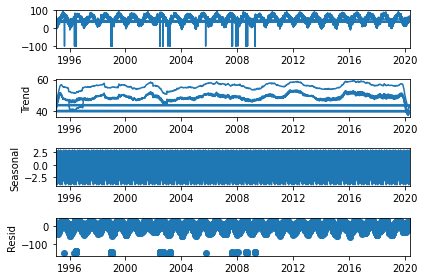

In [9]:
decompose = seasonal_decompose(NY,period=365)
decompose.plot();

Dickey Fuller Test Let's perform a Dickey Fuller test to verify the stationarity

Null hypothesis: The time series data is non stationary

In [10]:
from statsmodels.tsa.stattools import adfuller

In [11]:
adf = adfuller(x=NY['AvgTemperature'])
print('pvalue:',adf[1])
print('adf:',adf[0])
print('usedlag:',adf[2])
print('nobs:',adf[3])
print('critical_values:',adf[4])
print('icbest:',adf[5])

pvalue: 2.1909711434196814e-30
adf: -18.402719388087036
usedlag: 56
nobs: 46268
critical_values: {'1%': -3.4304913431061737, '5%': -2.861602470639082, '10%': -2.5668032510744254}
icbest: 334462.1136043981


The pvalue is very small, close to 0. Hence we can reject our null hypothesis. The data is stationary

LSTM Model Creation

In [12]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM,Dense
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.callbacks import EarlyStopping

Train - Test - Split: Choosing 2019 data for testing and remaining for training

In [13]:
test = NY[NY.index>'2019']
train = NY[NY.index<'2019']

Scaling train data and test data for LSTM Input

In [14]:
scaler = MinMaxScaler()
train = scaler.fit_transform(train)
test = scaler.transform(test)

In [15]:
time_steps = 20
features = 1

train_gen = TimeseriesGenerator(train,train,time_steps,batch_size=32)
test_gen = TimeseriesGenerator(test,test,time_steps,batch_size=32)

Defining a sequential model

In [16]:
model = Sequential()
model.add(LSTM(64,activation='relu',input_shape=(time_steps,features),return_sequences=True))
model.add(LSTM(32,activation='relu'))
model.add(Dense(1,activation='relu'))
model.compile(optimizer='adam',loss='mse')

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 20, 64)            16896     
_________________________________________________________________
lstm_1 (LSTM)                (None, 32)                12416     
_________________________________________________________________
dense (Dense)                (None, 1)                 33        
Total params: 29,345
Trainable params: 29,345
Non-trainable params: 0
_________________________________________________________________


Defining Callbacks

In [17]:
early_stop = EarlyStopping(patience=5)

Fitting the model

In [18]:
model.fit(x=train_gen,epochs=40,callbacks=[early_stop],validation_data=test_gen)

#Save the model
model.save('LSTMAvgTemp.h5')

Epoch 1/40
1370/1370 [==============================] - 15s 9ms/step - loss: 0.6105 - val_loss: 0.5858
Epoch 2/40
1370/1370 [==============================] - 14s 10ms/step - loss: 0.6105 - val_loss: 0.5858
Epoch 3/40
1370/1370 [==============================] - 15s 11ms/step - loss: 0.6105 - val_loss: 0.5858
Epoch 4/40
1370/1370 [==============================] - 16s 11ms/step - loss: 0.6105 - val_loss: 0.5858
Epoch 5/40
1370/1370 [==============================] - 15s 11ms/step - loss: 0.6105 - val_loss: 0.5858
Epoch 6/40
1370/1370 [==============================] - 16s 12ms/step - loss: 0.6105 - val_loss: 0.5858


Let's input X values in the test generator to the model and collect it's predictions

Let's also collect the original targets from the test generator

In [19]:
predict = model.predict(test_gen)
test_targets = test_gen.targets[test_gen.start_index:test_gen.end_index+1]

Let's inverse transform the scaled results

In [20]:
predict = scaler.inverse_transform(predict).ravel()
test_targets = scaler.inverse_transform(test_targets).ravel()

Model Evaluation The predictions of the model for the year 2019 are plotted with the actual target values of 2019

In [21]:
from sklearn.metrics import mean_squared_error

In [34]:
#_,ax=plt.subplots(1,1,figsize=(12,8))
#sns.lineplot(x=range(len(predict)),y=predict,ax=ax,label='Predictions')
#sns.lineplot(x=range(len(test_targets)),y=test_targets,ax=ax,label='Actual')
#plt.legend()
#_=plt.title('Comparison - Predictions vs Actual Target Temperatures - NewYork (2019)')

In [23]:
print('The RMSE Score is:',format(np.sqrt(mean_squared_error(predict,test_targets)),'.2f'))

The RMSE Score is: 147.48


Forecasting beyond 2019

Select the last 'time_steps' values of average temperature from test data. It can be used to forecast further.

In [24]:
data = NY.iloc[-time_steps:].to_numpy() #2D Array
data = scaler.transform(data)

#expand to include batch dimension
data = np.expand_dims(data,0)

#record the last date of observartion from the data
date = NY.index[-1]

date_store = NY.iloc[-time_steps:].index.to_list()

#forecasting
forecasts=10
for i in range(forecasts):
    predicted = model.predict(data[:,-20:,:])
    date = date+datetime.timedelta(days=1)
    data = np.append(data,[predicted],axis=1)
    date_store.append(date)
data = scaler.inverse_transform(data.reshape(1,-1))
forecast_df = pd.DataFrame(index=date_store[time_steps-1:],data={'AvgTemperature':data.ravel()[time_steps-1:]})

Let's print and plot the forecast_df

The first datapoint in forecast_df is not predicted. It is borrowed from the given data to ensure continuity while plotting

In [25]:
forecast_df

,AvgTemperature
2020-05-13,33.8
2020-05-14,-99.0
2020-05-15,-99.0
2020-05-16,-99.0
2020-05-17,-99.0
2020-05-18,-99.0
2020-05-19,-99.0
2020-05-20,-99.0
2020-05-21,-99.0
2020-05-22,-99.0


In [35]:
#_,ax=plt.subplots(1,1,figsize=(12,8))
#sns.lineplot(data=NY.iloc[-100:,:],y='AvgTemperature',x=NY.iloc[-100:,:].index,color='blue',ax=ax,label='AvgTemp - 2019 end')
#sns.lineplot(data=forecast_df,y='AvgTemperature',x=forecast_df.index,color='red',ax=ax,label= 'AvgTemp - 2020 forecasted')
#_=plt.title(f'Temperature Forecasting - {forecasts} days (2020)')

# Seasonal ARIMA Model

In [27]:
!pip3 install -q pmdarima
from pmdarima.arima import auto_arima
from dateutil.relativedelta import relativedelta

The data should be downsampled to train the Seasonal ARIMA model faster. So here we are downsampling the data from daily to monthly frequency. If downsampling is not performed, the model created will be very huge in this case

In [28]:
NY_monthly = NY.resample('M').mean()
NY_monthly.head(5)

,AvgTemperature
Date,
1995-01-31,32.440000
1995-02-28,24.695000
1995-03-31,39.656129
1995-04-30,44.064000
1995-05-31,57.931613


In [29]:
data =[go.Scatter(x=NY.index,y=NY['AvgTemperature'],name='AvTemperature-Daily',marker=dict(color='grey')),go.Scatter(x= NY_monthly.index,y=NY_monthly['AvgTemperature'],name='AvgTemperature-Monthly',marker=dict(color='red'))]
fig = go.Figure(data)

buttons = [dict(label='Both',method='restyle',args=[{'visible':[True,True]}]),
           dict(label='Daily',method='restyle',args=[{'visible':[True,False]}]),
           dict(label='Monthly',method='restyle',args=[{'visible':[False,True]}])]

updatemenus=[dict(type="buttons",direction='down',buttons=buttons)]
fig.update_layout(updatemenus=updatemenus,title='Average Temperature - Daily and Monthly - New York')

The auto arima function can automatically determine arima parameters and model

The data is seasonal with the frequency of 12 months

In [30]:
#using default auto_arima arguments
model = auto_arima(NY_monthly,seasonal=True,m=12)

Storing date and temperature of the last row so that forecast plot can be made continuous

In [31]:
date = NY_monthly.index[-1]
last_val = NY_monthly.iloc[-1].to_numpy()

Forecasting for the first 6 months in 2020

In [32]:
forecasts=6
date_store = [(date + relativedelta(months=i)) for i in range(0,forecasts+1)]

predict = model.predict(forecasts)
predict =  np.append(last_val,predict)
forecast_df = pd.DataFrame(data=predict,index=date_store,columns=['AvgTemperature'])
forecast_df.head(5)

,AvgTemperature
2020-05-31,47.726154
2020-06-30,63.853862
2020-07-31,72.567823
2020-08-31,71.177142
2020-09-30,65.210730


Plotting results

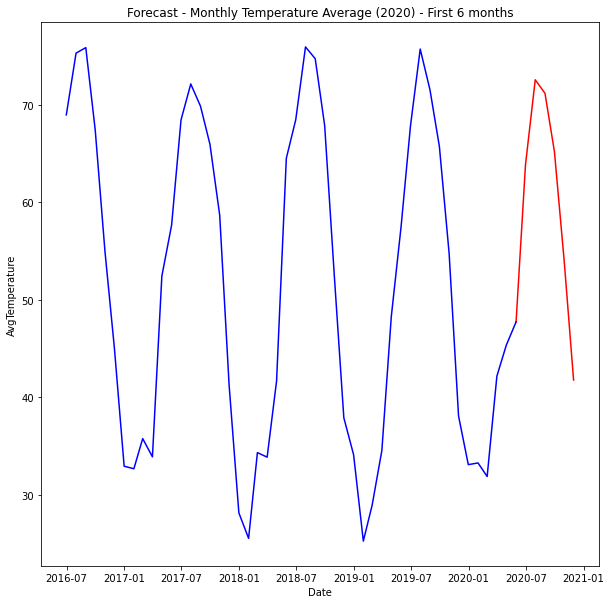

In [33]:
_,ax=plt.subplots(1,1,figsize=(10,10))
sns.lineplot(data=forecast_df['AvgTemperature'],ax=ax,color='red')
sns.lineplot(data=NY_monthly['AvgTemperature'][-4*12:],ax=ax,color='blue')
_=plt.title(f'Forecast - Monthly Temperature Average (2020) - First {forecasts} months')